# **Case Study - 2 (FOTS: Fast Oriented Text Spotting)**


## **Importing Libraries**

In [36]:
# mandatory libraries
import os
import numpy as np
import pandas as pd

#plotting libraries
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

#computer vision libraries
import cv2

#file extracting libraries
from zipfile import ZipFile
import scipy.io

#miscellaneous libraries
import warnings
warnings.filterwarnings("ignore")
from tqdm.notebook import tqdm
import joblib
from scipy import stats

## **Mounting Google Drive**

In [ ]:
#mounting google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## **Downloading Datasets**

### **Synth-Text**

Dataset link : https://www.robots.ox.ac.uk/~vgg/data/scenetext/

In [ ]:
!wget -O SynthText.zip https://thor.robots.ox.ac.uk/~vgg/data/scenetext/SynthText.zip

--2021-07-03 01:47:45--  https://thor.robots.ox.ac.uk/~vgg/data/scenetext/SynthText.zip
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
Connecting to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40717671794 (38G) [application/zip]
Saving to: ‘SynthText.zip’

SynthText.zip       100%[===================>]  37.92G  11.2MB/s    in 59m 27s 

2021-07-03 02:47:13 (10.9 MB/s) - ‘SynthText.zip’ saved [40717671794/40717671794]



### **ICDAR-15**

Dataset link: https://rrc.cvc.uab.es/?ch=4&com=downloads

**Note:** you need to register in the above mentioned URL else you can't able to download the dataset.

In [ ]:
!wget --header="Host: rrc.cvc.uab.es" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://rrc.cvc.uab.es/?ch=4&com=downloads" --header="Cookie: _ga=GA1.2.269986937.1624706527; PHPSESSID=mbdov6dmu2bkdu1kkgdn41f8c2; _gid=GA1.2.1278905833.1625080724; _gat=1" --header="Connection: keep-alive" "https://rrc.cvc.uab.es/downloads/ch4_training_images.zip" --no-check-certificate -c -O 'ch4_training_images.zip'

--2021-07-03 03:56:31--  https://rrc.cvc.uab.es/downloads/ch4_training_images.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 90667586 (86M) [application/zip]
Saving to: ‘ch4_training_images.zip’

ch4_training_images 100%[===================>]  86.47M  7.18MB/s    in 14s     

2021-07-03 03:56:46 (6.14 MB/s) - ‘ch4_training_images.zip’ saved [90667586/90667586]



In [ ]:
!wget --header="Host: rrc.cvc.uab.es" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://rrc.cvc.uab.es/?ch=4&com=downloads" --header="Cookie: _ga=GA1.2.269986937.1624706527; PHPSESSID=mbdov6dmu2bkdu1kkgdn41f8c2; _gid=GA1.2.1278905833.1625080724" --header="Connection: keep-alive" "https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip" --no-check-certificate -c -O 'ch4_training_localization_transcription_gt.zip'

--2021-07-02 07:23:16--  https://rrc.cvc.uab.es/downloads/ch4_training_localization_transcription_gt.zip
Resolving rrc.cvc.uab.es (rrc.cvc.uab.es)... 158.109.8.55
Connecting to rrc.cvc.uab.es (rrc.cvc.uab.es)|158.109.8.55|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 344624 (337K) [application/zip]
Saving to: ‘ch4_training_localization_transcription_gt.zip’

ch4_training_locali 100%[===================>] 336.55K  --.-KB/s    in 0.1s    

2021-07-02 07:23:16 (2.26 MB/s) - ‘ch4_training_localization_transcription_gt.zip’ saved [344624/344624]



## **Pre-processing**

### **SynthText**

1) Synth-Text is a synthetically generated dataset, in which word instances are placed in natural scene images, while taking into account the scene layout.

2) The dataset consists of 800 thousand images with approximately 8 million synthetic word instances. Each text instance is annotated with its text-string, word-level and character-level bounding-boxes.

3) Compresed(.zip) file is of 38 GB and on extracting the all the file it consumes 41 GB of storage. Colab doesn't provide with 70+ GB.

4) But i am able to get all the image details/properies for EDA by "**Divide and Conquer**" strategy. I extracted a single image from the compressed file and get the details about the image, delete it. This step will iterated over loop. I have learned/inspired this strategy from Microsoft Malware Assignment i.e. when the data-set is larger than disk storage, we need to see a way to get the required file, process it and delete it (atleast for EDA).

#### **Image Details**

In [ ]:
#get the list of files names present in the .zip file
data=!unzip -l ./SynthText.zip

In [ ]:
#get only .jpg files from the above list
img_file_names=[]
for i in data:
  if (i.endswith(".jpg")):
    img_file_names.append(i)

In [ ]:
print("No:of image files in Synth Text dataset = ",len(img_file_names))

No:of image files in Synth Text dataset =  858771


In [ ]:
#random check
img_file_names[23232]

'    40881  2016-04-12 14:07   SynthText/38/coal_91_22.jpg'

In [ ]:
# removing unncessary text & keeping only the name of the file 
img_file_names=[i.split()[-1] for i in img_file_names]

In [ ]:
#random check
img_file_names[5:8]

['SynthText/42/cows_10_2.jpg',
 'SynthText/42/concert_67_28.jpg',
 'SynthText/42/cows_104_49.jpg']

In [ ]:
def image_details(img_path):
    """function to get the image details like width, height and file size (KB)"""
    try:
        img=cv2.imread(img_path,cv2.COLOR_BGR2RGB)
        width,height,channels=img.shape
        img_file_size=os.path.getsize(img_path)/1024
        return [width,height,img_file_size]
    except:
        return None

In [ ]:
#zipfile object to extract image from zip file
file_name="/content/SynthText.zip"
zpfile=ZipFile(file_name,'r')

In [ ]:
#loop to extract a single image & get its details and delete the image
img_det=[]
for img in tqdm(img_file_names):
    zpfile.extract(img)
    im_de=image_details(img)
    if im_de == None:
        print("image file not present-",img)
        continue
    details=[img]
    details.extend(im_de)
    img_det.append(details)
    os.remove(img)
zpfile.close()

image file not present- SynthText/188/._vintage+cars_1_96.jpg
image file not present- SynthText/188/._village_67_21.jpg
image file not present- SynthText/188/._vintage+cars_1_98.jpg
image file not present- SynthText/23/._bob+dylan_66_107.jpg
image file not present- SynthText/52/._desert_7_31.jpg
image file not present- SynthText/52/._desert_7_24.jpg
image file not present- SynthText/52/._desert_7_9.jpg
image file not present- SynthText/52/._desert_7_32.jpg
image file not present- SynthText/52/._desert_87_0.jpg
image file not present- SynthText/52/._desert_7_10.jpg
image file not present- SynthText/52/._desert_7_30.jpg
image file not present- SynthText/30/._chocolate_8_0.jpg
image file not present- SynthText/37/._coal_12_70.jpg
image file not present- SynthText/37/._coal_16_103.jpg
image file not present- SynthText/37/._coal_12_22.jpg
image file not present- SynthText/37/._coal_12_60.jpg
image file not present- SynthText/37/._coal_12_71.jpg
image file not present- SynthText/37/._coal_12

The above 21  ._**image_name**.jpg are not actual images. As per the dataset authors we are having total of 858750 i.e. (858771-21=858750)

So, we have sucessfully got the all image details present in the dataset. 

In [ ]:
#storing all the image details in a pandas dataframe
st_img_details_df=pd.DataFrame(data=img_det,columns=["Image","Width",
                                                     "Height","Size in KB"])

In [ ]:
#storing the above dataframe to disk (you can also save as .pkl file)
st_img_details_df.to_csv("/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_img_details.csv",
                         header=True,index=False)

In [ ]:
#random sample of 5 images and its details
st_img_details_df.sample(5)

,Image,Width,Height,Size in KB
49539,SynthText/120/nile_5_60.jpg,450,600,53.926758
9253,SynthText/131/places_30_54.jpg,375,600,64.022461
190921,SynthText/144/resort_46_49.jpg,450,600,61.486328
681327,SynthText/170/sun_28_12.jpg,375,600,18.837891
478483,SynthText/184/tyres_22_47.jpg,178,600,19.380859


#### **Ground Truths**

Synth-Text dataset authors/creators, provided ground-truths (GT) in a matlab file format (.mat)

Authors mentoned the file name of ground truths (gt.mat). below next 4 steps are optional. 

In [ ]:
#get the list of file names in zip file
data=!unzip -l ./SynthText.zip

In [ ]:
#getting list of .mat file(s)
mat_file_names=[]
for i in data:
  if (i.endswith(".mat")):
    mat_file_names.append(i)

In [ ]:
#should be only one
print("No:of .mat files in Synth Text dataset = ",len(mat_file_names))

No:of .mat files in Synth Text dataset =  1


In [ ]:
mat_file_names[0]

'1923568429  2016-04-15 01:51   SynthText/gt.mat'

In [ ]:
#getting the .mat file name
mat_file_name=mat_file_names[0].split()[-1]
mat_file_name

'SynthText/gt.mat'

In [ ]:
#extracting gt.mat file
file_name="/content/SynthText.zip"
mat_file_name="SynthText/gt.mat"
zpfile=ZipFile(file_name,'r')
zpfile.extract(mat_file_name)
zpfile.close()

Details of the gt.mat file was well documented by authors as below.

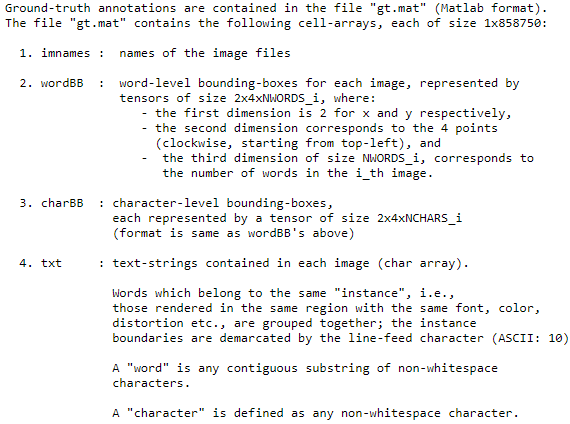

In [ ]:
#loading the .mat file using scipy.io.loadmat
#ref: https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.loadmat.html
st_gt = scipy.io.loadmat(mat_file_name)

In [ ]:
#scipy.io.loadmat returns dict, check the ref link above
type(st_gt)

dict

In [ ]:
#get the keys of the st_gt ground truths
st_gt.keys()

dict_keys(['__header__', '__version__', '__globals__', 'charBB', 'wordBB', 'imnames', 'txt'])

In [ ]:
#from points 1,2,4 in the above image
#getting the image file name & its coresponding text labels present in that image
# and all the bounding box co-ordinates for each text label.
# and store these details into a pandas data-frame

data=[]
for img,bbox,text in tqdm(zip(st_gt['imnames'][0],st_gt['wordBB'][0],st_gt['txt'][0]),total=len(st_gt['imnames'][0])):
    data.append(["SynthText/"+img[0],bbox,text])
st_gt_df=pd.DataFrame(data=data,columns=['Image','BBox','Text'])

In [ ]:
#check the points 2,4 in the above image
def bbox_vertices(data):
    """function to re-arrange the bounding boxes vertices from
    [[[x1,x2,x3,x4],[y1,y2,y3,y4]]] to 
    [[(x1,y1),(x2,y2),(x3,y3),(x4,y4)]]
    """
    all_vertices=[]
    if len(data.shape)==3:
        for i in range(data.shape[-1]):
            vertices = [(data[0][0][i], data[1][0][i]),
                        (data[0][1][i], data[1][1][i]),
                        (data[0][2][i], data[1][2][i]),
                        (data[0][3][i], data[1][3][i])]
            all_vertices.append(vertices)
        return np.array(all_vertices)

    elif (len(data.shape)==2):
        vertices = [(data[0][0], data[1][0]),
                        (data[0][1], data[1][1]),
                        (data[0][2], data[1][2]),
                        (data[0][3], data[1][3])]
        all_vertices.append(vertices)
        return np.array(all_vertices)

In [ ]:
#applying the above function
st_gt_df['BBox']=st_gt_df['BBox'].map(bbox_vertices)

In [ ]:
#sample of 5 from the st_gt data-frame
st_gt_df.sample(5)

,Image,BBox,Text
842322,SynthText/141/rajasthan_118_36.jpg,"[[[101.2283, -3.3928719], [290.4797, 3.53833],...","[that the\na newspaper, sky , ..."
403424,SynthText/198/wozniak_64_15.jpg,"[[[298.31085, 418.1869], [354.05103, 416.3454]...","[use , claim\nw..."
686640,SynthText/163/steel_144_14.jpg,"[[[74.3595, 43.760796], [116.83113, 52.471912]...","[Has , the , Hi, , the ..."
182365,SynthText/129/photos_130_91.jpg,"[[[33.91249, 145.23703], [43.155807, 74.86038]...","[wants , check\nnot, the ]"
379432,SynthText/93/kerala_75_49.jpg,"[[[404.75732, 165.41617], [611.48596, 170.1886...","[would , From: , how , the , are you, ..."


In [ ]:
#saving the groundtruth in a .pkl compressed file
#avoid storing in .csv format(check this https://stackoverflow.com/q/45704999 &
#                                https://stackoverflow.com/q/48428100)

joblib.dump(st_gt_df,'/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_gt_df.pkl.gz',compress=('gzip', 3))

Pre-processing for Synth-Text dataset is completed to proceed to do EDA

### **ICDAR-15**

1)ICDAR-2015 Dataset is a real world dataset having images from wearable camera.

2) This dataset consists of 1000 train-set images & 500 test-set images  which are blurry & less focus on the text and less legible.

3) Building a model to recognize text from less legible images is quite challenging.

4) Considering a deep-learning model training, 1000 images are very less in number

5) I have used same strategy that was seen in Synth-Text to get the image details/properties.

#### **Image Details**

In [ ]:
#getting all list of file names present in the .zip file
data=!unzip -l ./ch4_training_images.zip

In [ ]:
#getting only .jpg file names
img_file_names=[]
for i in data:
  if (i.endswith(".jpg")):
    img_file_names.append(i)

In [ ]:
print("No:of image files in ICDAR-15 dataset = ",len(img_file_names))

No:of image files in ICDAR-15 dataset =  1000


In [ ]:
#random check
img_file_names[232]

'    71839  2015-01-09 17:43   img_233.jpg'

In [ ]:
#getting the only required file name.
img_file_names=[i.split()[-1] for i in img_file_names]

In [ ]:
#random check
img_file_names[5:8]

['img_6.jpg', 'img_7.jpg', 'img_8.jpg']

In [ ]:
def image_details(img_path):
    """function to get the image details like width, height and file size (KB)"""
    try:
        img=cv2.imread(img_path,cv2.COLOR_BGR2RGB)
        width,height,channels=img.shape
        img_file_size=os.path.getsize(img_path)/1024
        return [width,height,img_file_size]
    except:
        return None

In [ ]:
#zipfile object to extract image from zip file
file_name="/content/ch4_training_images.zip"
zpfile=ZipFile(file_name,'r')

In [ ]:
#loop to extract a single image & get its details and delete the image
img_det=[]
for img in tqdm(img_file_names):
    zpfile.extract(img)
    im_de=image_details(img)
    if im_de == None:
        print("image file not present-",img)
        continue
    details=[img]
    details.extend(im_de)
    img_det.append(details)
    os.remove(img)
zpfile.close()

In [ ]:
#storing all the image details in a pandas dataframe
icdar15_img_details_df=pd.DataFrame(data=img_det,columns=["Image","Width",
                                                          "Height","Size in KB"])

In [ ]:
#storing the above dataframe to disk (you can also save as .pkl file)
icdar15_img_details_df.to_csv("/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_img_details.csv",
                          header=True,index=False)

In [ ]:
#random sample of 5 images and its details
icdar15_img_details_df.sample(5)

,Image,Width,Height,Size in KB
649,img_650.jpg,720,1280,80.607422
185,img_186.jpg,720,1280,117.993164
369,img_370.jpg,720,1280,119.111328
487,img_488.jpg,720,1280,66.830078
125,img_126.jpg,720,1280,116.569336


#### **Ground Truths**

1) ICDAR-2015 dataset authors provided ground truths in .txt file i.e each image have its corresponding ground truth .txt file

2) Each image contains multiple text labels(seperated by new line char). Ground truth files contains all the text labels present in the image and bounding box co-ordinates for each text label.

3) Format of the annotation as follows...

    "x1,y1,x2,y2,x3,y3,x4,y4,textlabel/n"

4 vertices of the bounding-box, followed by text label


4) some of the text which is not clear or chinese text in the images are annotated as ###, which need to be ignored during training & loss/metric calculations

In [ ]:
#getting all list of file names present in the .zip file
data=!unzip -l ./ch4_training_localization_transcription_gt.zip

In [ ]:
#getting only .txt files
txt_file_names=[]
for i in data:
  if (i.endswith(".txt")):
    txt_file_names.append(i)

In [ ]:
#should be same as no:of images
print("No:of .txt files in ICDAR-15 dataset = ",len(txt_file_names))

No:of .txt files in ICDAR-15 dataset =  1000


In [ ]:
#random check
txt_file_names[0]

'      275  2015-03-12 13:06   gt_img_1.txt'

In [ ]:
#getting only required part of file name
txt_file_names=[i.split()[-1] for i in txt_file_names]

In [ ]:
#random check
txt_file_names[5:8]

['gt_img_6.txt', 'gt_img_7.txt', 'gt_img_8.txt']

In [ ]:
#zipfile object to extract the required files from .zip file
file_name="/content/ch4_training_localization_transcription_gt.zip"
zpfile=ZipFile(file_name,'r')

In [ ]:
#loop to get all the ground truths i.e bounding box, text labels -
#present in the each image
data=[]
for txt_file in tqdm(txt_file_names):
    img_name=txt_file[3:].replace(".txt",".jpg")
    zpfile.extract(txt_file)
    with open(txt_file,'r',encoding='utf-8-sig') as f:
        lines=f.readlines()
        bbox_cords=[]
        labels=[]
        for line in lines:
            label=",".join(line.split(",")[8:])[0:-1] 
            #logic to handle "," present in text label.check out gt_img_39.txt
            co_ords=line.split(",")[0:8]
            co_ord_pair=np.array([(float(co_ords[i]),float(co_ords[i+1]))\
                                  for i in range(0,len(co_ords),2)])
            bbox_cords.append(co_ord_pair)
            labels.append(label)
        bbox_cords=np.array(bbox_cords)
        labels=np.array(labels)
    os.remove(txt_file)
    data.append([img_name,txt_file,bbox_cords,labels])
zpfile.close()

In [ ]:
#storing the ground truth data in pandas dataframe
icdar15_gt_df=pd.DataFrame(data=data,columns=['Image','Ground_Truth','BBox','Text'])

In [ ]:
#random sample check on the ground truth data-frame
icdar15_gt_df.sample(5)

,Image,Ground_Truth,BBox,Text
907,img_908.jpg,gt_img_908.txt,"[[[779.0, 319.0], [964.0, 322.0], [967.0, 481....","[coast, LONDON]"
101,img_102.jpg,gt_img_102.txt,"[[[310.0, 504.0], [524.0, 426.0], [555.0, 517....","[Shop, Dine, SMRT]"
645,img_646.jpg,gt_img_646.txt,"[[[2.0, 247.0], [115.0, 247.0], [113.0, 287.0]...","[RLD, ###, SPORTS, ###, ###]"
699,img_700.jpg,gt_img_700.txt,"[[[2.0, 92.0], [216.0, 177.0], [213.0, 233.0],...","[GUCCI, ###, ###, ###, ###, ###, ###, ###, ###]"
131,img_132.jpg,gt_img_132.txt,"[[[176.0, 266.0], [222.0, 268.0], [218.0, 319....",[###]


In [ ]:
#saving the groundtruth in a .pkl compressed file
#avoid storing in .csv format(check this https://stackoverflow.com/q/45704999 &
#                                https://stackoverflow.com/q/48428100)


joblib.dump(icdar15_gt_df,"/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_gt_df.pkl.gz",compress=('gzip', 3))

['/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_gt_df.pkl.gz']

Pre-processing for ICDAR-15 dataset is completed, to proceed to do EDA

## **EDA**

### **EDA on SynthText Dataset**

**EDA on Image details/properties**

In [29]:
#loading the saved synth-text image details data-frame
st_img_details_df=pd.read_csv("/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_img_details.csv")
st_img_details_df.sample(5)

,Image,Width,Height,Size in KB
83359,SynthText/60/farm_115_22.jpg,225,600,28.988281
762504,SynthText/162/stanford+cathedral_40_45.jpg,450,600,43.617188
360426,SynthText/20/birds_18_72.jpg,401,600,29.727539
695181,SynthText/61/farm_4_108.jpg,450,600,57.335938
6827,SynthText/136/pottery_73_0.jpg,428,600,43.886719


In [30]:
#basic statistics like mean, stnd deviation, quantiles
st_img_details_df.describe()

,Width,Height,Size in KB
count,858750.000000,858750.000000,858750.000000
mean,425.369492,586.494388,44.258165
std,89.581040,45.940586,17.211113
min,119.000000,227.000000,6.428711
25%,375.000000,600.000000,31.920898
50%,401.000000,600.000000,41.234375
75%,450.000000,600.000000,53.519531
max,600.000000,600.000000,169.098633


#### **Uni-Variant Analysis**

##### **PDF**

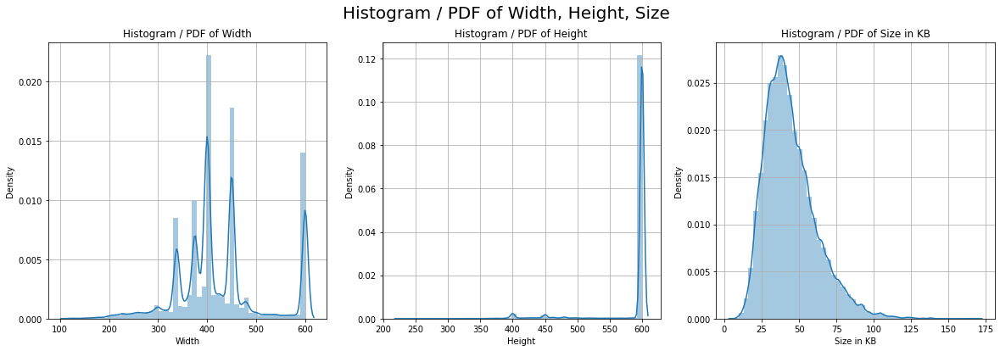

In [ ]:
fig, axes = plt.subplots(ncols=3, nrows=1,figsize=(20,6))
fig.suptitle("Histogram / PDF of Width, Height, Size",fontsize=20)

for col, ax in zip(st_img_details_df.columns[1:], axes.flat):
    sns.distplot(st_img_details_df[col].values, hist=True, ax=ax)
    ax.set_xlabel(col)
    ax.set_title("Histogram / PDF of "+col)
    ax.grid()
plt.show()

**Observations :**

1) Most of the images width is ranged from 300-500 and some are having 600.

2) Most of the images height is 600 and very few can be seen at 400, 450.

3) Size of the image file is spread across from 6-169 KB. Most of the files have size of 30-53 KB

##### **CDF**

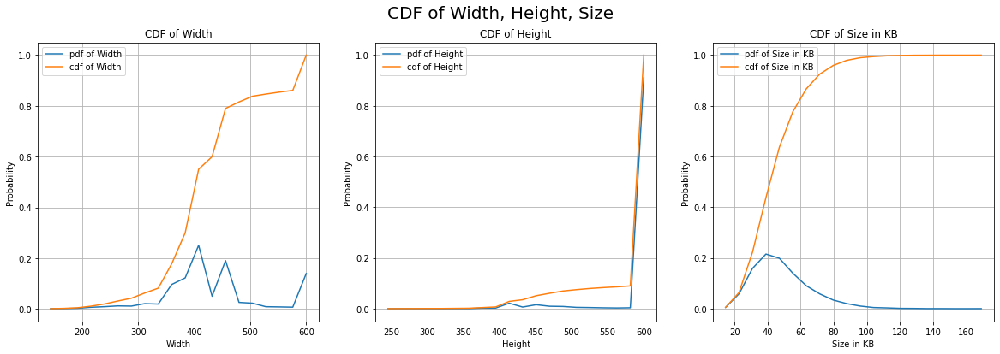

In [ ]:
fig, axes = plt.subplots(ncols=3, nrows=1,figsize=(20,6))
fig.suptitle("CDF of Width, Height, Size",fontsize=20)

for col, ax in zip(st_img_details_df.columns[1:], axes.flat):
    counts, bin_edges = np.histogram(st_img_details_df[col], bins=20,density = True)
    pdf = counts/(sum(counts))
    cdf = np.cumsum(pdf)
    ax.plot(bin_edges[1:],pdf,label="pdf of "+col)
    ax.plot(bin_edges[1:], cdf,label="cdf of "+col)
    ax.set_xlabel(col)
    ax.set_ylabel("Probability")
    ax.set_title("CDF of "+col)
    ax.grid()
    ax.legend()
plt.show()

**Observations :**

1) More than 80% of the image are having width of 500

2) Most of the images are having height of 600

3) More than 90% of the images are having file size of 80 KB. 

##### **Quantiles**

In [ ]:
percentiles=[]
for i in range(100):
    if i<=90 and i %10 ==0:
        percentiles.append(i)
    elif i >90:
        percentiles.append(i)
for i in range(1,11):
    percentiles.append((i*0.1)+99)

data=[percentiles]
for col in st_img_details_df.columns[1:]:
    data.append(np.percentile(st_img_details_df[col],percentiles))
pd.DataFrame(data=np.array(data).T,columns=['Percentile','Width','Height','Size'])

,Percentile,Width,Height,Size
0,0.0,119.0,227.0,6.428711
1,10.0,338.0,600.0,25.120117
2,20.0,371.0,600.0,29.937500
3,30.0,384.0,600.0,33.897461
4,40.0,400.0,600.0,37.616211
5,50.0,401.0,600.0,41.234375
6,60.0,432.0,600.0,45.366211
7,70.0,450.0,600.0,50.509766
8,80.0,464.0,600.0,56.828125
9,90.0,600.0,600.0,67.481543


**Observations :**

1) Only 10 percentile of the images are having height less than 600.

2) More than 90 percentile of the images are having width 600.

3) Median of image file size is 41.23 KB.

##### **Box-Plot**

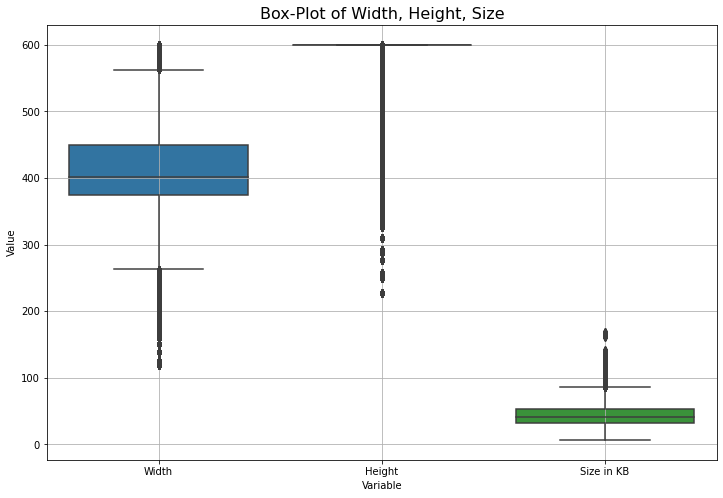

In [ ]:
fig, axes = plt.subplots(figsize=(12,8))
sns.boxplot(data=st_img_details_df.iloc[:,1:],ax=axes)
axes.set_title("Box-Plot of Width, Height, Size",fontsize=16)
axes.set_xlabel("Variable")
axes.set_ylabel("Value")
axes.grid()
plt.show()

**Observations :**

1) IQR range of the Image height is zero.

2) IQR range of Image width is non-zero and also it contains few outliers at the both ends.

3) IQR range of Image file size is non-zero and also it contains few outliers after 80 KB.

##### **Violin Plot**

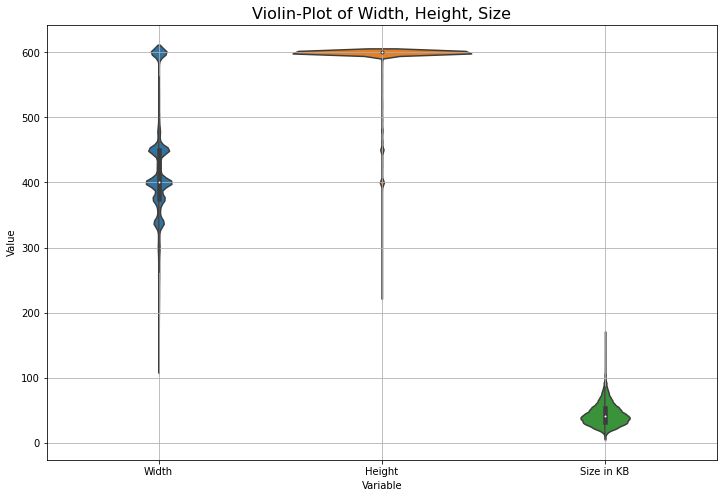

In [ ]:
fig, axes = plt.subplots(figsize =(12,8))
sns.violinplot(data=st_img_details_df.iloc[:,1:],ax=axes)
axes.set_title("Violin-Plot of Width, Height, Size",fontsize=16)
axes.set_xlabel("Variable")
axes.set_ylabel("Value")
axes.grid()
plt.show()

**Observation :**

1) Median of the Images width is 401 and there are few images having less than 300 and more than 500. That is why it is observed as outliers.

2) As observed earlier, only 10 percentile image height are less than 600. which are considered as outlier here. Hence IQR of images height is zero.

3) Image file size median is non-zero and there are few images crossing 100KB which are considered as outliers from the box/violin plot.

**EDA on Bounding Boxes**

In [32]:
#loading the pre-processed synth-text ground truth dataframe
st_gt_df=joblib.load('/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_gt_df.pkl.gz')

In [ ]:
#samples from the st_gt data-frame
st_gt_df.sample(5)

,Image,BBox,Text
842322,SynthText/141/rajasthan_118_36.jpg,"[[[101.2283, -3.3928719], [290.4797, 3.53833],...","[that the\na newspaper, sky , ..."
403424,SynthText/198/wozniak_64_15.jpg,"[[[298.31085, 418.1869], [354.05103, 416.3454]...","[use , claim\nw..."
686640,SynthText/163/steel_144_14.jpg,"[[[74.3595, 43.760796], [116.83113, 52.471912]...","[Has , the , Hi, , the ..."
182365,SynthText/129/photos_130_91.jpg,"[[[33.91249, 145.23703], [43.155807, 74.86038]...","[wants , check\nnot, the ]"
379432,SynthText/93/kerala_75_49.jpg,"[[[404.75732, 165.41617], [611.48596, 170.1886...","[would , From: , how , the , are you, ..."


##### **PDF of no:of bounding boxes**

In [33]:
#find the total no:of bounding-boxes
no_of_bboxes=[row.shape[0] for row in st_gt_df['BBox'].values]

In [35]:
#basic statistics on no: of bounding boxes
pd.DataFrame({'no_of_bbx':no_of_bboxes}).describe()

,no_of_bbx
count,858750.000000
mean,8.462144
std,4.808659
min,1.000000
25%,5.000000
50%,8.000000
75%,11.000000
max,63.000000


In [47]:
print("Most common no:of bounding boxes = ",stats.mode(no_of_bboxes)[0][0],\
      "(found",stats.mode(no_of_bboxes)[1][0],"/",len(no_of_bboxes),")")

Most common no:of bounding boxes =  6 (found 76744 / 858750 )


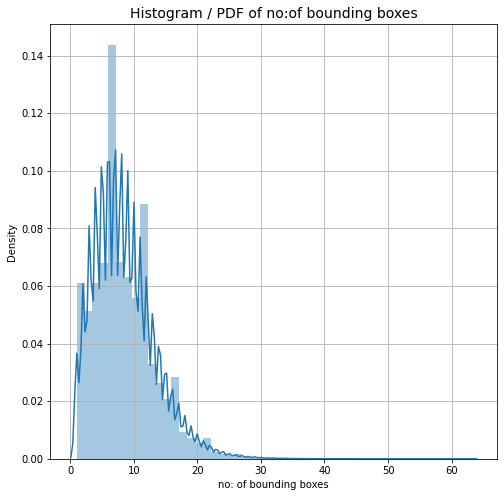

In [ ]:
fig, ax = plt.subplots(figsize=(8,8))
sns.distplot(no_of_bboxes, hist=True, ax=ax)
ax.set_xlabel("no: of bounding boxes")
ax.set_title("Histogram / PDF of no:of bounding boxes",fontsize=14)
ax.grid()
plt.show()

**Observation :**

1) Distribution of no:of bounding boxes per image is spread over 1-63.

2) Most of the images are having bounding boxes 3-13

3) There are few images with more than 20 bounding boxes.

4) 6 bounding boxes are found most frequently in the dataset.

##### **CDF of no:of bounding boxes**

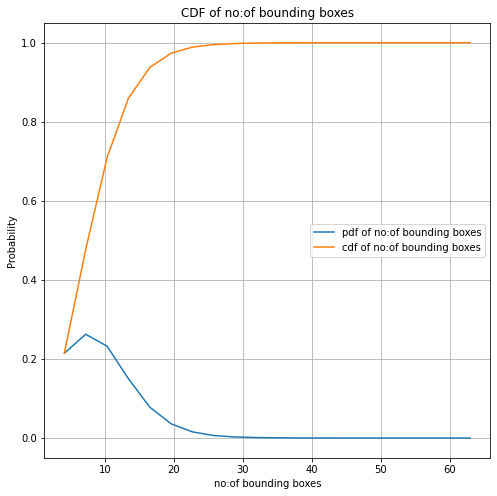

In [50]:
fig, ax = plt.subplots(figsize=(8,8))
counts, bin_edges = np.histogram(no_of_bboxes, bins=20,density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
ax.plot(bin_edges[1:],pdf,label="pdf of no:of bounding boxes")
ax.plot(bin_edges[1:], cdf,label="cdf of no:of bounding boxes")
ax.set_xlabel("no:of bounding boxes")
ax.set_ylabel("Probability")
ax.set_title("CDF of no:of bounding boxes")
ax.grid()
ax.legend()
plt.show()

**Observations :**

1) Approximately 70% of the images are having 10 bounding boxes.

2) Approximately 80% of the images are having 12 bounding boxes.

3) More than 90% of the images are having 20 bounding boxes.

##### **No:of Images Vs No:of Bounding Boxes**

In [ ]:
#counting no:of images having 1,2,3, so on (till max) no:of bounding boxes
uniq_bbox, img_counts = np.unique(no_of_bboxes, return_counts=True)
pd.DataFrame(data=np.array([uniq_bbox,img_counts]).T,
             columns=['No:of bounding box','No:of Images'])

,No:of bounding box,No:of Images
0,1,24408
1,2,40536
2,3,54474
3,4,64890
4,5,72285
5,6,76744
6,7,76355
7,8,72857
8,9,67322
9,10,59281


**Observations**

1) There are less than 25K images with 1 bounding box

2) More than 50K images are observed each of 3,4,5,6,7,8,9,10,11 bounding boxes.

3) Most of the images are having 6 bounding boxes.

##### **PDF of Bounding Box Width & Height**

In [ ]:
#calculating bounding-box width and height with help of the co-ordinates
width=[]
height=[]
for row in tqdm(st_gt_df['BBox'].values):
    w=[]
    h=[]
    for bb in row:
        w1=np.linalg.norm(bb[0] - bb[1])
        h1=np.linalg.norm(bb[1] - bb[2])
        w.append(w1)
        h.append(h1)
    w=np.array(w)
    h=np.array(h)
    width.append(w)
    height.append(h)
width=np.array(width)
height=np.array(height)

In [ ]:
#storing bounding box width & height in the st_gt dataframe
st_gt_df['BBox_Width']=width
st_gt_df['BBox_Height']=height

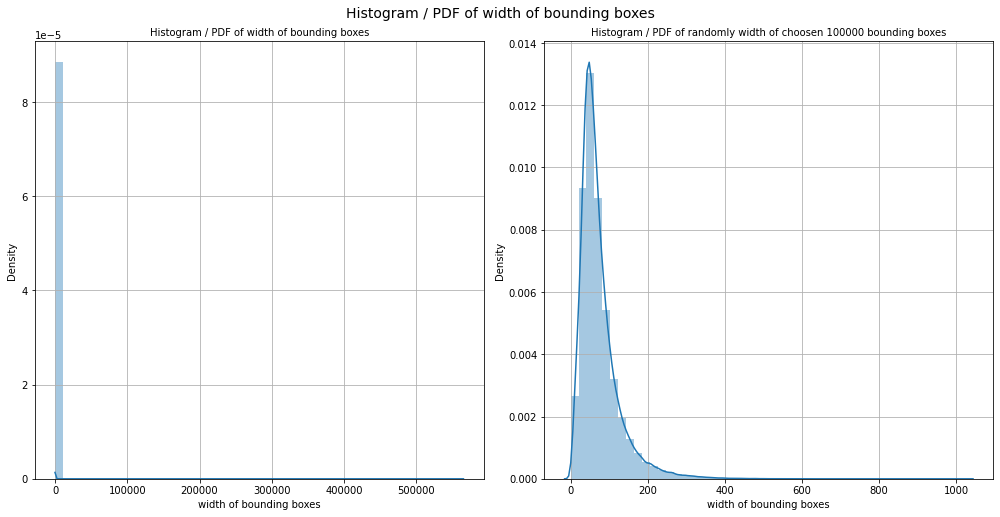

In [ ]:
#plotting histogram of width of the bounding boxes.
fig, ax = plt.subplots(ncols=2,nrows=1,figsize=(14,7))
fig.suptitle("Histogram / PDF of width of bounding boxes",fontsize=14,y=1.02)

sns.distplot(np.hstack(st_gt_df['BBox_Width'].values), hist=True, ax=ax[0])
ax[0].set_xlabel("width of bounding boxes")
ax[0].set_title("Histogram / PDF of width of bounding boxes",fontsize=10)
ax[0].grid()

sns.distplot(np.random.choice(np.hstack(st_gt_df['BBox_Width'].values),100000), 
             hist=True, ax=ax[1])
ax[1].set_xlabel("width of bounding boxes")
ax[1].set_title("Histogram / PDF of randomly width of choosen 100000 bounding boxes",fontsize=10)
ax[1].grid()

plt.tight_layout()
plt.show()

**Observations :**

1) Each images contains multiples bounding boxes. To vizualize the histogram of all bounding boxes width in the dataset is quite not interpretable. so plotted random 10000 bounding boxes.

2) Most of the bounding boxes are having width 10-180

3) There are few bounding boxes with width more than 200

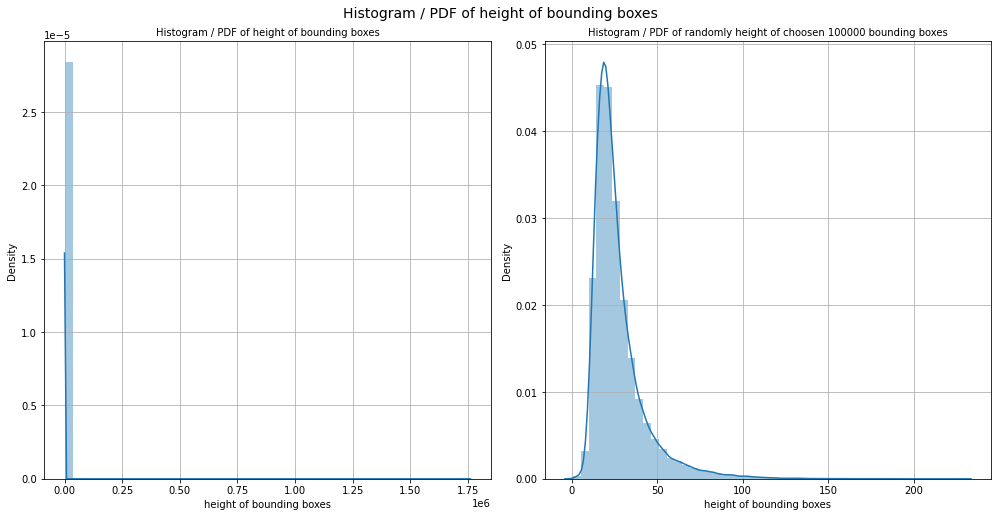

In [ ]:
fig, ax = plt.subplots(ncols=2,nrows=1,figsize=(14,7))
fig.suptitle("Histogram / PDF of height of bounding boxes",fontsize=14,y=1.02)

sns.distplot(np.hstack(st_gt_df['BBox_Height'].values), hist=True, ax=ax[0])
ax[0].set_xlabel("height of bounding boxes")
ax[0].set_title("Histogram / PDF of height of bounding boxes",fontsize=10)
ax[0].grid()

sns.distplot(np.random.choice(np.hstack(st_gt_df['BBox_Height'].values),100000),
             hist=True, ax=ax[1])
ax[1].set_xlabel("height of bounding boxes")
ax[1].set_title("Histogram / PDF of randomly height of choosen 100000 bounding boxes",fontsize=10)
ax[1].grid()

plt.tight_layout()
plt.show()

**Observations :**

1) Each images contains multiples bounding boxes. To vizualize the histogram of all bounding boxes height in the dataset is quite not interpretable. so plotted random 10000 bounding boxes.

2) Most of the bounding boxes are having height 20-50 (approx)

3) There are few bounding boxes with height more than 50

In [ ]:
#Merging the image details data frame & ground truth data frame
st_total= pd.merge(st_img_details_df, st_gt_df, on="Image",how="inner")
st_total.shape

(858750, 8)

In [ ]:
#sample of 5 rows from the total synth text dataframe
st_total.sample(5)

,Image,Width,Height,Size in KB,BBox,Text,BBox_Width,BBox_Height
501668,SynthText/78/hubble_106_92.jpg,446,600,45.467773,"[[[-0.5820694, 118.58072], [43.76348, 99.09946...","[and\nwrong , run , MA:\nSL: ...","[48.436012, 77.73124, 58.203342, 76.1066, 62.9...","[12.020714, 12.060291, 20.233517, 40.11277, 38..."
118556,SynthText/181/tree+trunk_78_0.jpg,600,432,31.907227,"[[[295.1071, 546.11597], [418.6594, 555.66797]...","[oname, ...","[123.921, 63.1411, 133.79485, 189.73805, 81.60...","[30.904081, 25.474646, 110.46632, 77.92922, 26..."
802022,SynthText/114/net_32_90.jpg,478,600,48.966797,"[[[428.96295, 196.16579], [500.1853, 191.25578...","[later,\n etc, \n the \nme his\n they , could...","[71.391396, 47.20899, 42.287636, 36.8045, 40.0...","[23.990612, 24.114855, 23.823881, 16.38252, 23..."
556072,SynthText/153/sandwich_22_44.jpg,400,600,36.928711,"[[[-5.5516205, 303.52295], [92.62501, 284.5302...","[the , to the , Now , int , s...","[99.99687, 18.394695, 29.055874, 53.118965, 47...","[38.436726, 14.392531, 17.519938, 27.627823, 1..."
776606,SynthText/112/mouth+of+a+river_2_47.jpg,450,600,36.683594,"[[[145.6166, 82.44075], [224.64915, 91.587265]...","[Rob, , from ,...","[79.56007, 217.26912, 66.65677, 76.45145, 64.5...","[62.445435, 36.997433, 21.465565, 22.005152, 1..."


In [ ]:
joblib.dump(st_total,'/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_total.pkl.gz',compress=('gzip', 3))

['/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_total.pkl.gz']

### **EDA on ICDAR-15 Dataset**

**EDA on ICDAR-15 image details/properties**

In [51]:
#loading ICDAR-15 saved image details data-frame
icdar15_img_details_df=pd.read_csv("/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_img_details.csv")
icdar15_img_details_df.sample(5)

,Image,Width,Height,Size in KB
692,img_693.jpg,720,1280,62.338867
477,img_478.jpg,720,1280,82.708008
548,img_549.jpg,720,1280,78.046875
589,img_590.jpg,720,1280,89.984375
750,img_751.jpg,720,1280,81.212891


In [52]:
#basic statistics
icdar15_img_details_df.describe()

,Width,Height,Size in KB
count,1000.0,1000.0,1000.000000
mean,720.0,1280.0,88.913610
std,0.0,0.0,19.855504
min,720.0,1280.0,22.381836
25%,720.0,1280.0,77.001953
50%,720.0,1280.0,86.068359
75%,720.0,1280.0,100.018555
max,720.0,1280.0,187.536133


#### **Uni-Variant Analysis**

##### **PDF**

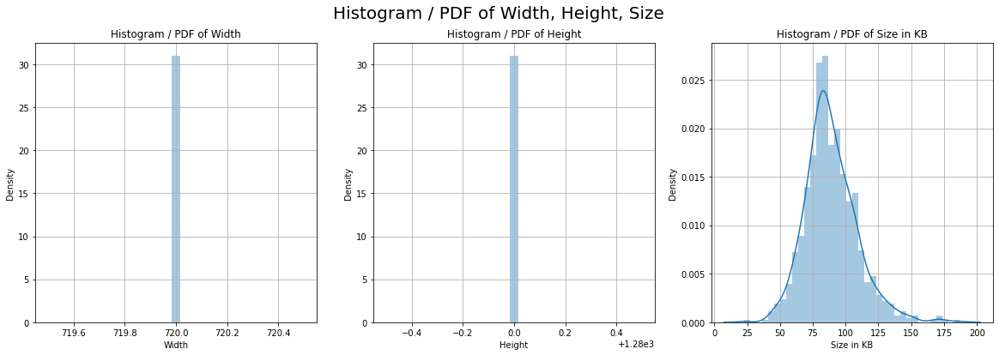

In [ ]:
fig, axes = plt.subplots(ncols=3, nrows=1,figsize=(20,6))
fig.suptitle("Histogram / PDF of Width, Height, Size",fontsize=20)

for col, ax in zip(icdar15_img_details_df.columns[1:], axes.flat):
    sns.distplot(icdar15_img_details_df[col].values, hist=True, ax=ax)
    ax.set_xlabel(col)
    ax.set_title("Histogram / PDF of "+col)
    ax.grid()
plt.show()

**Observations :**

1) All the images in ICDAR-15 training dataset are of size i.e width x height = 720 x 1280. So there is no point in continuing uni-variant analysis on these 2 features.

2) ICDAR-15 images file-size are spread from 22-180 KB. Most of the images are having file size of 60-120 KB.

##### **CDF**

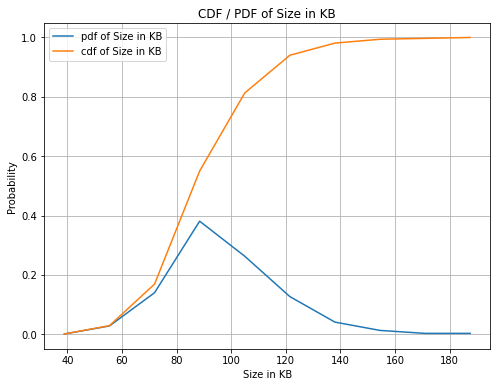

In [ ]:
fig, axes = plt.subplots(ncols=1, nrows=1,figsize=(8,6))

for col, ax in zip(icdar15_img_details_df.columns[3:], [axes]):
    counts, bin_edges = np.histogram(icdar15_img_details_df[col], bins=10,density = True)
    pdf = counts/(sum(counts))
    cdf = np.cumsum(pdf)
    ax.plot(bin_edges[1:],pdf,label="pdf of "+col)
    ax.plot(bin_edges[1:], cdf,label="cdf of "+col)
    ax.set_xlabel(col)
    ax.set_ylabel("Probability")
    ax.set_title("CDF / PDF of "+col)
    ax.grid()
    ax.legend()
plt.show()

**Observations**

1) Approximately 90% of image files have the file size of 120 KB

2) Approximately 80% of images files have the file size of 100 KB.

##### **Quantiles**

In [ ]:
percentiles=[]
for i in range(100):
    if i<=90 and i %10 ==0:
        percentiles.append(i)
    elif i >90:
        percentiles.append(i)
for i in range(1,11):
    percentiles.append((i*0.1)+99)

data=[percentiles]
for col in icdar15_img_details_df.columns[3:]:
    data.append(np.percentile(icdar15_img_details_df[col],percentiles))
pd.DataFrame(data=np.array(data).T,columns=['Percentile','Size in KB'])

,Percentile,Size in KB
0,0.0,22.381836
1,10.0,66.310059
2,20.0,73.700195
3,30.0,78.667090
4,40.0,82.727344
5,50.0,86.068359
6,60.0,91.443164
7,70.0,96.644629
8,80.0,103.362500
9,90.0,112.641895


**Observations :**

1) 80 percentile of images contains the file size of 103 KB 

2) 99 percentile of images contains the files size of 147.7 KB 

##### **Box-Plot**

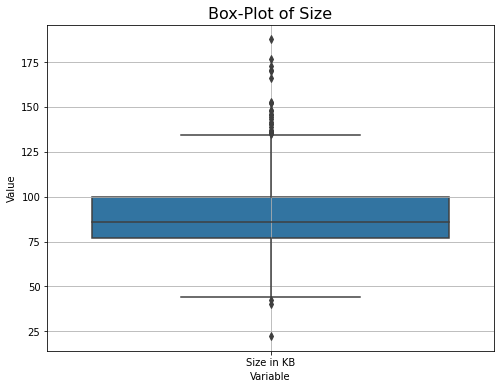

In [ ]:
fig, axes = plt.subplots(figsize=(8,6))
sns.boxplot(data=icdar15_img_details_df.iloc[:,3:],ax=axes)
axes.set_title("Box-Plot of Size",fontsize=16)
axes.set_xlabel("Variable")
axes.set_ylabel("Value")
axes.grid()
plt.show()

**Observations :**

1) IQR of image file size is non-zero 

2) Few outliers are present on the both ends.

##### **Violin Plot**

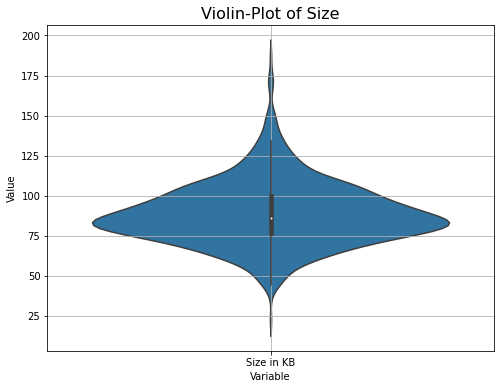

In [ ]:
fig, axes = plt.subplots(figsize =(8,6))
sns.violinplot(data=icdar15_img_details_df.iloc[:,3:],ax=axes)
axes.set_title("Violin-Plot of Size",fontsize=16)
axes.set_xlabel("Variable")
axes.set_ylabel("Value")
axes.grid()
plt.show()

**Observations :**

1) Combining the PDF & Box plot advantages, Image file size IQR is non zero and there are few outliers at the both ends.

2) Median (50 percentile) of file size is approximately 85 KB.

3) 75th percentile of file size is greater than 100 KB.

**EDA on Bounding Boxes**

##### **PDF of no:of bounding boxes**

In [54]:
#finding the no:of bounding boxes present in each image
no_of_bboxes=[row.shape[0] for row in icdar15_gt_df['BBox'].values]

In [56]:
#basic statistics on no:of bounding boxes
pd.DataFrame(data={"no_of_bbx":no_of_bboxes}).describe()

,no_of_bbx
count,1000.000000
mean,11.886000
std,12.298954
min,1.000000
25%,5.000000
50%,9.000000
75%,14.000000
max,157.000000


In [57]:
print("Most common no:of bounding boxes = ",stats.mode(no_of_bboxes)[0][0],\
      "(found",stats.mode(no_of_bboxes)[1][0],"/",len(no_of_bboxes),")")

Most common no:of bounding boxes =  4 (found 93 / 1000 )


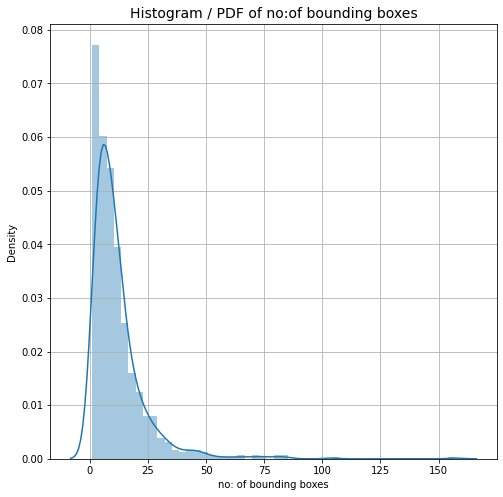

In [ ]:
#plotting PDF of no:of bounding boxes
fig, ax = plt.subplots(figsize=(8,8))
sns.distplot(no_of_bboxes, hist=True, ax=ax)
ax.set_xlabel("no: of bounding boxes")
ax.set_title("Histogram / PDF of no:of bounding boxes",fontsize=14)
ax.grid()
plt.show()

**Observations :**

1) The distribution of no:of bounding boxes per image ranges over 1-159.

2) Most of the images have the 1-25 bounding boxes.

3) Mean of the no:of bounding boxes is approximately 12 

##### **CDF of no:of bounding boxes**

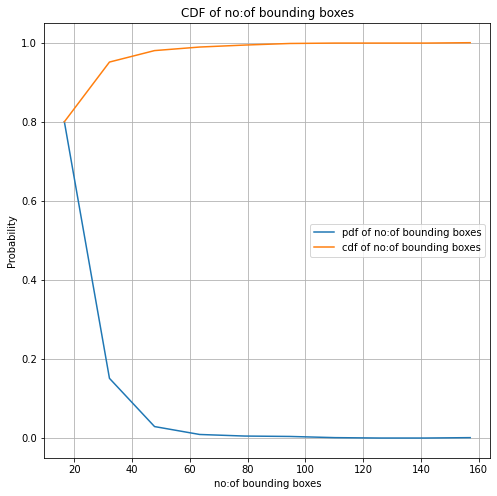

In [59]:
fig, ax = plt.subplots(figsize=(8,8))
counts, bin_edges = np.histogram(no_of_bboxes, bins=10,density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
ax.plot(bin_edges[1:],pdf,label="pdf of no:of bounding boxes")
ax.plot(bin_edges[1:], cdf,label="cdf of no:of bounding boxes")
ax.set_xlabel("no:of bounding boxes")
ax.set_ylabel("Probability")
ax.set_title("CDF of no:of bounding boxes")
ax.grid()
ax.legend()
plt.show()

**Observation :**

1) More than 80% of the images contains 20 bounding boxes.

2) More than 95% of the images contains 40 bounding boxes.

##### **Count of Bounding Boxes Vs No: of Images**

In [ ]:
uniq_bbox, img_counts = np.unique(no_of_bboxes, return_counts=True)
pd.DataFrame(data=np.array([uniq_bbox,img_counts]).T,columns=['No:of bounding box','No:of Images'])

,No:of bounding box,No:of Images
0,1,33
1,2,54
2,3,61
3,4,93
4,5,68
...,...,...
57,80,1
58,83,1
59,85,1
60,104,1


**Observations**

1) Total of 62 different combinations are found.

2) There are only a single images with  bounding boxes 80-157.

##### **PDF of BBox Width & Height**

In [ ]:
#calculating the bounding box width & height using bbox co-ordinates
width=[]
height=[]
for row in tqdm(icdar15_gt_df['BBox'].values):
    w=[]
    h=[]
    for bb in row:
        w1=np.linalg.norm(bb[0] - bb[1])
        h1=np.linalg.norm(bb[1] - bb[2])
        w.append(w1)
        h.append(h1)
    w=np.array(w)
    h=np.array(h)
    width.append(w)
    height.append(h)
width=np.array(width)
height=np.array(height)

In [ ]:
#storing the bbox width and height in ground truth data-frame
icdar15_gt_df['BBox_Width']=width
icdar15_gt_df['BBox_Height']=height

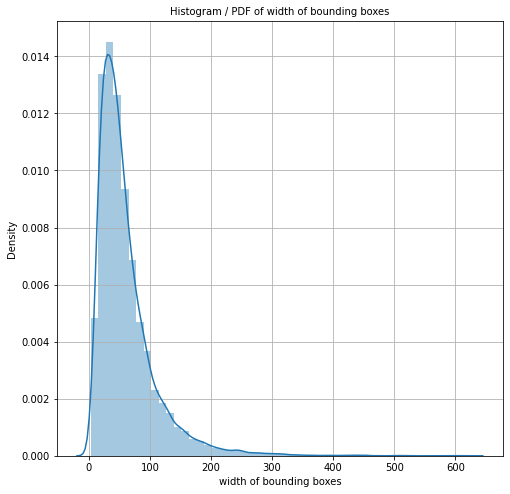

In [ ]:
#plotting PDF of bounding box width.
fig, ax = plt.subplots(figsize=(8,8))

sns.distplot(np.hstack(icdar15_gt_df['BBox_Width'].values), hist=True, ax=ax)
ax.set_xlabel("width of bounding boxes")
ax.set_title("Histogram / PDF of width of bounding boxes",fontsize=10)
ax.grid()

plt.show()

**Observations :**

1) Most of the bounding box width ranges in 20-100.

2) There are few bounding boxes with width more than 200

3) Average width of the bounding boxes is approximately 60.

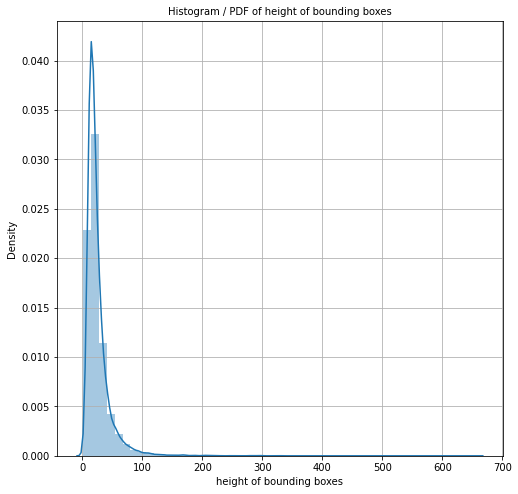

In [ ]:
fig, ax = plt.subplots(figsize=(8,8))

sns.distplot(np.hstack(icdar15_gt_df['BBox_Height'].values), hist=True, ax=ax)
ax.set_xlabel("height of bounding boxes")
ax.set_title("Histogram / PDF of height of bounding boxes",fontsize=10)
ax.grid()

plt.show()

**Observations :**

1) Most of the bounding box height ranges in 10-70.

2) There are few bounding boxes with height more than 100

3) Average height of the bounding boxes is approximately 50.

In [ ]:
#merging ICDAR-15 processed image details & ground truth in a single data-frame 
icdar15_total= pd.merge(icdar15_img_details_df, icdar15_gt_df, 
                        on="Image",how="inner")
icdar15_total.shape

(1000, 9)

In [ ]:
#sample of total ICDAR-15 dataframe 
icdar15_total.sample(5)

,Image,Width,Height,Size in KB,Ground_Truth,BBox,Text,BBox_Width,BBox_Height
777,img_778.jpg,720,1280,93.311523,gt_img_778.txt,"[[[373.0, 108.0], [505.0, 156.0], [495.0, 224....","[Dior, ###, ###, ###]","[140.4563989286355, 56.43580423808985, 29.1547...","[68.73136110975832, 27.073972741361768, 15.0, ..."
464,img_465.jpg,720,1280,100.170898,gt_img_465.txt,"[[[545.0, 308.0], [593.0, 288.0], [596.0, 310....","[SRIM, ###, ###, ###, ###, ###, ###, Chaeng, #...","[52.0, 68.8839603971781, 124.03628501370073, 2...","[22.20360331117452, 41.23105625617661, 66.4830..."
107,img_108.jpg,720,1280,82.949219,gt_img_108.txt,"[[[454.0, 316.0], [495.0, 317.0], [495.0, 327....","[CARD, READER, ###, EXIT, SIDE-GATE, RESIDENTS...","[41.012193308819754, 60.0, 20.0, 31.0, 73.0273...","[10.0, 13.0, 12.0, 12.0, 12.0, 10.0, 10.0, 11...."
565,img_566.jpg,720,1280,94.059570,gt_img_566.txt,"[[[305.0, 111.0], [375.0, 96.0], [378.0, 115.0...","[MAC, ###, ORIGINS, ###, ###, CHANEL, ###, ###]","[71.58910531638176, 49.09175083453431, 75.0266...","[19.235384061671343, 17.0, 20.0, 20.0249843945..."
32,img_33.jpg,720,1280,67.790039,gt_img_33.txt,"[[[376.0, 237.0], [402.0, 235.0], [401.0, 247....","[###, SMOKING]","[26.076809620810597, 73.17103251970687]","[12.041594578792296, 13.0]"


In [ ]:
#saving the ICDAR-15 total data frame to disk
joblib.dump(icdar15_total,'/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_total.pkl.gz',compress=('gzip', 3))

['/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_total.pkl.gz']

## Vizualization

In [ ]:
def extract_images_from_zip_file(file_name,files_to_be_extracted):
    """function to extract required files from the zip file"""
    zpfile=ZipFile(file_name,'r')
    for f in files_to_be_extracted:
        zpfile.extract(f)
    zpfile.close()

In [ ]:
def display_images_with_bounding_box(images,bounding_boxes):
    """function to display original Vs image with bounding-box around the
    text labels present in the image"""
    fig,axes=plt.subplots(2,len(images),figsize=(20,12))
    axes=axes.flatten()
    ax_idx=0    
    for count in range(2):
        for img,bbx in zip(images,bounding_boxes):
            axes[ax_idx].set_title("Original Image")
            i = cv2.imread(img, cv2.IMREAD_COLOR)
            i = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
            if (count ==1):
                for bb in bbx:
                    bbox = patches.Polygon(bb,linewidth=2,edgecolor='green',facecolor='none')
                    axes[ax_idx].add_patch(bbox)
                axes[ax_idx].set_title("With bounding-boxes")            
            axes[ax_idx].imshow(i)
            ax_idx+=1
    plt.show()

In [ ]:
def remove_files(files_to_be_removed):
    """function to delete files after processing"""
    for i in files_to_be_removed:
        os.remove(i)

### Synth Text

In [ ]:
#loading the saved synth-text pre-processed data-frame
st_total=joblib.load("/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/st_total.pkl.gz")

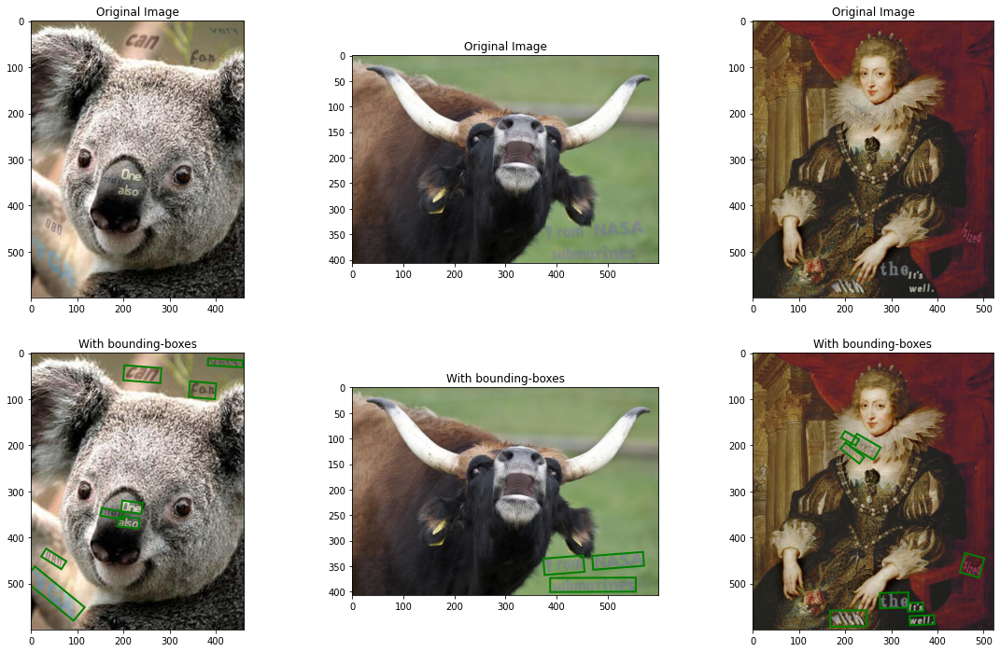

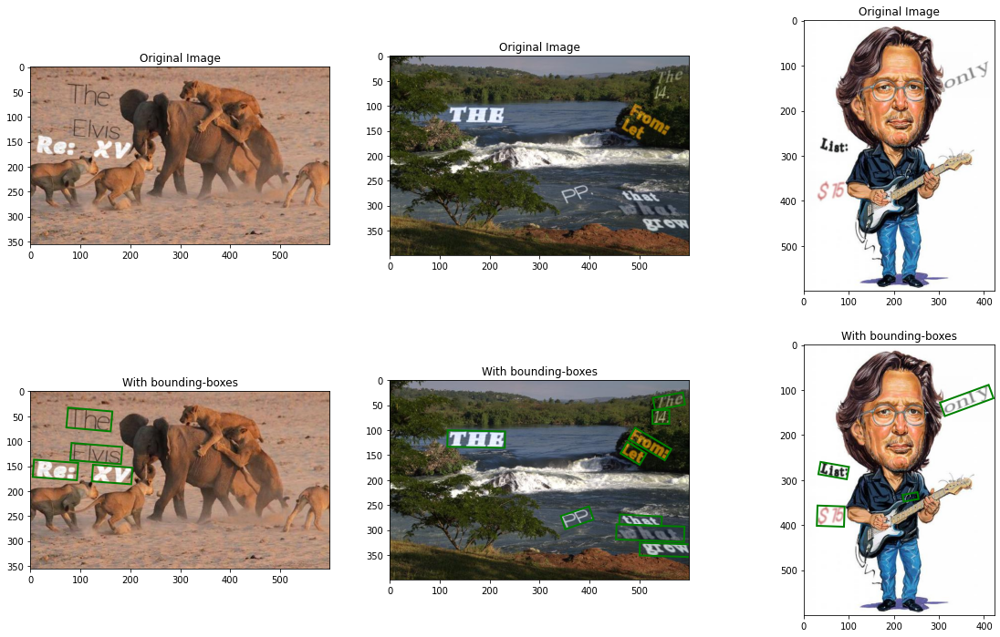

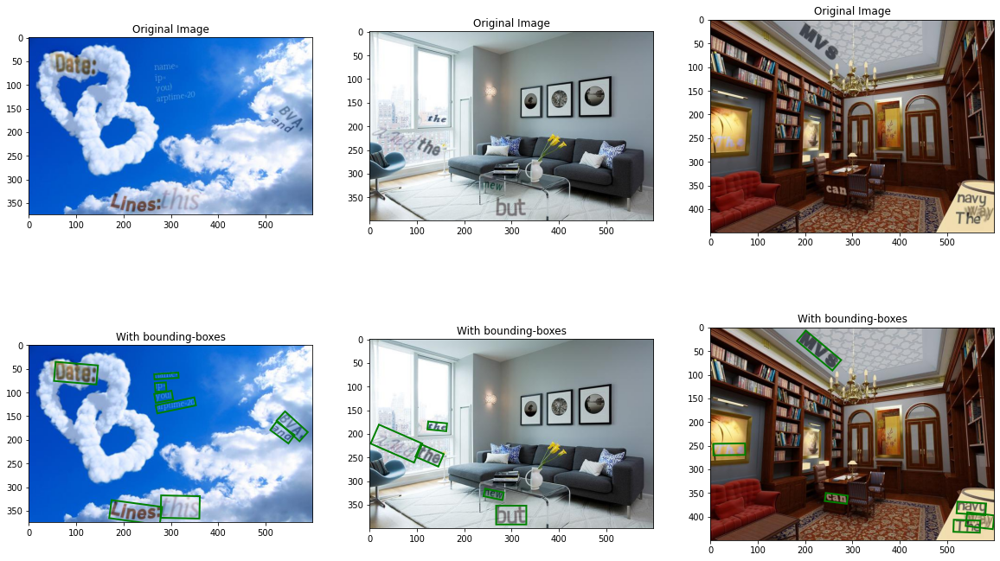

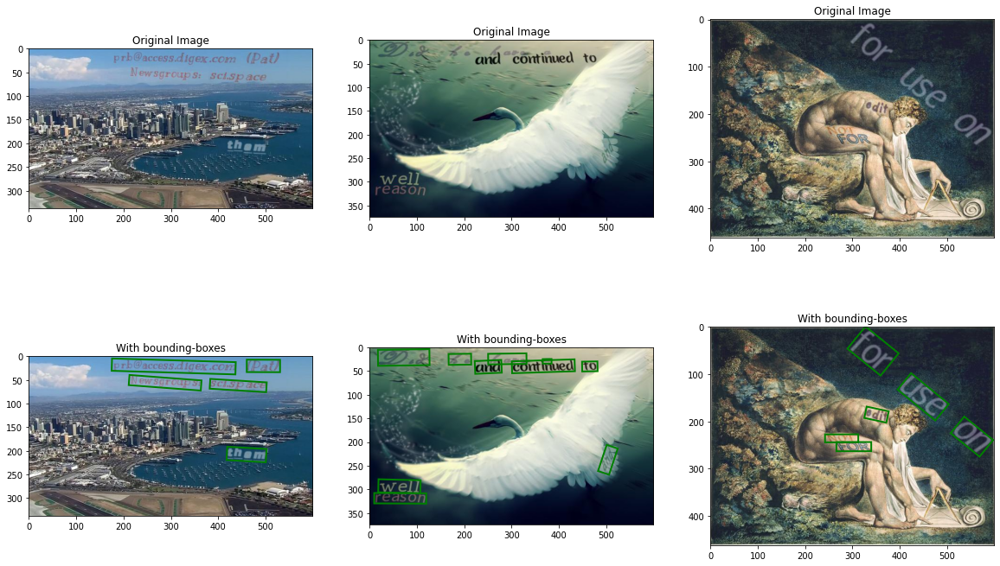

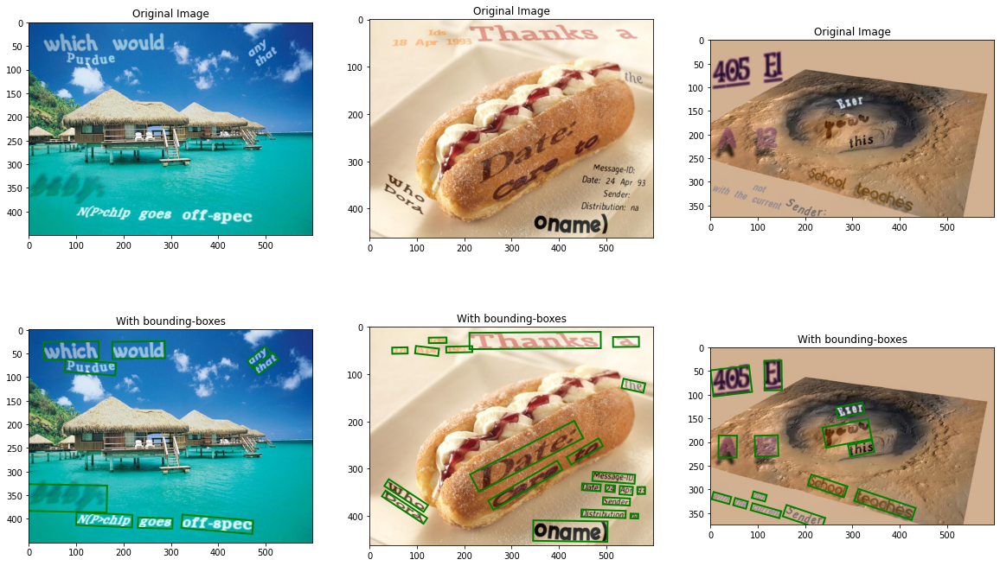

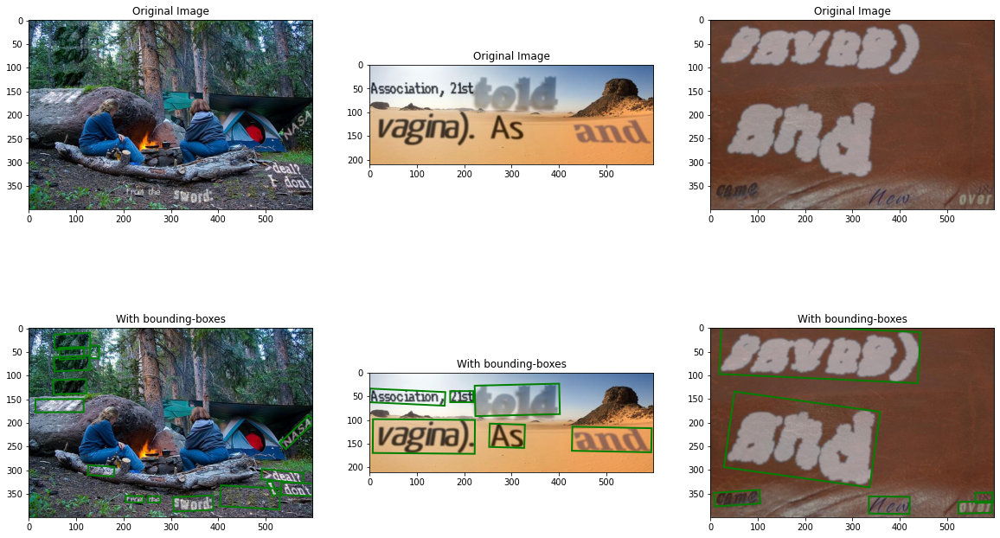

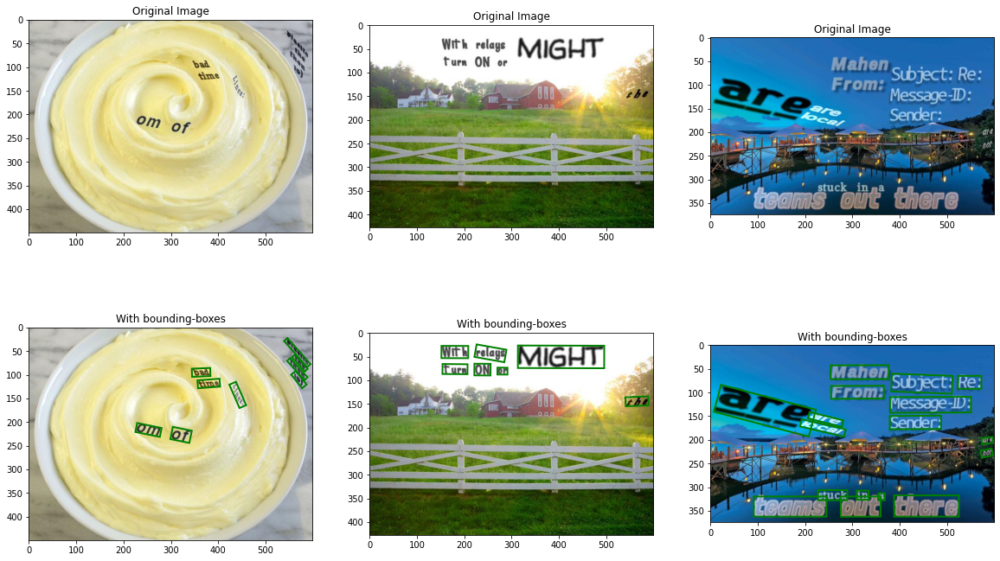

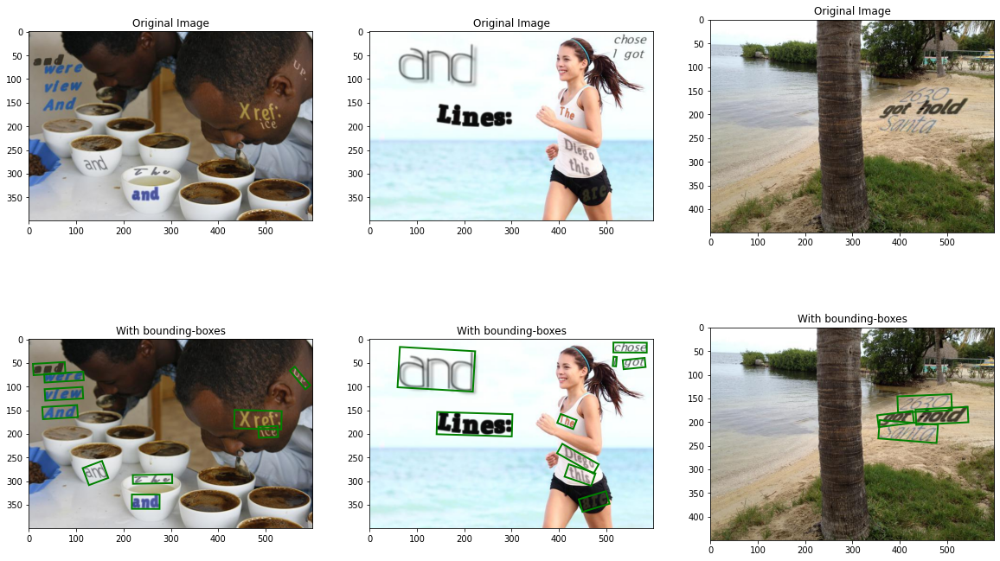

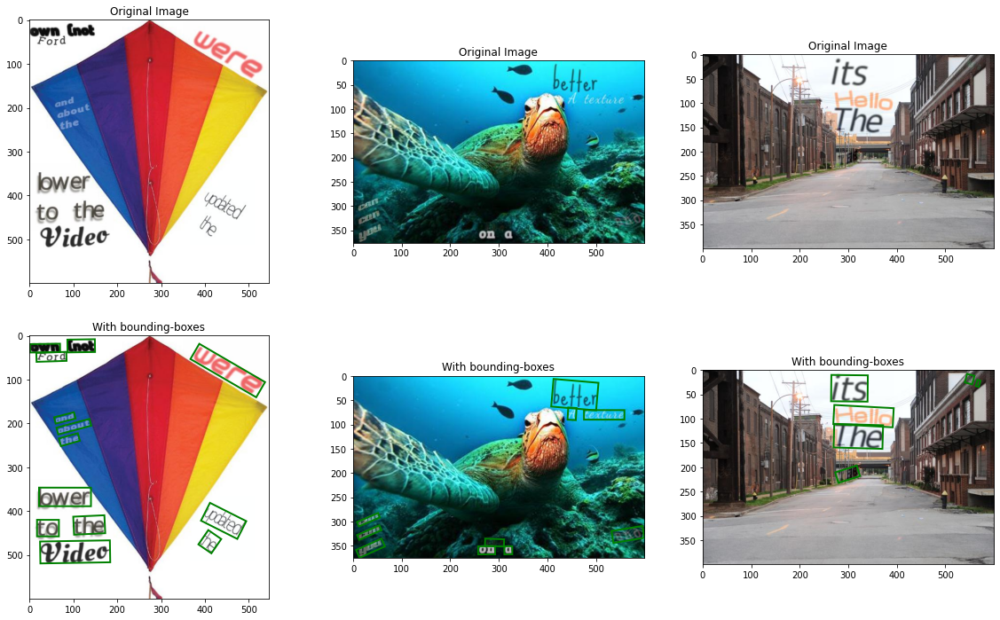

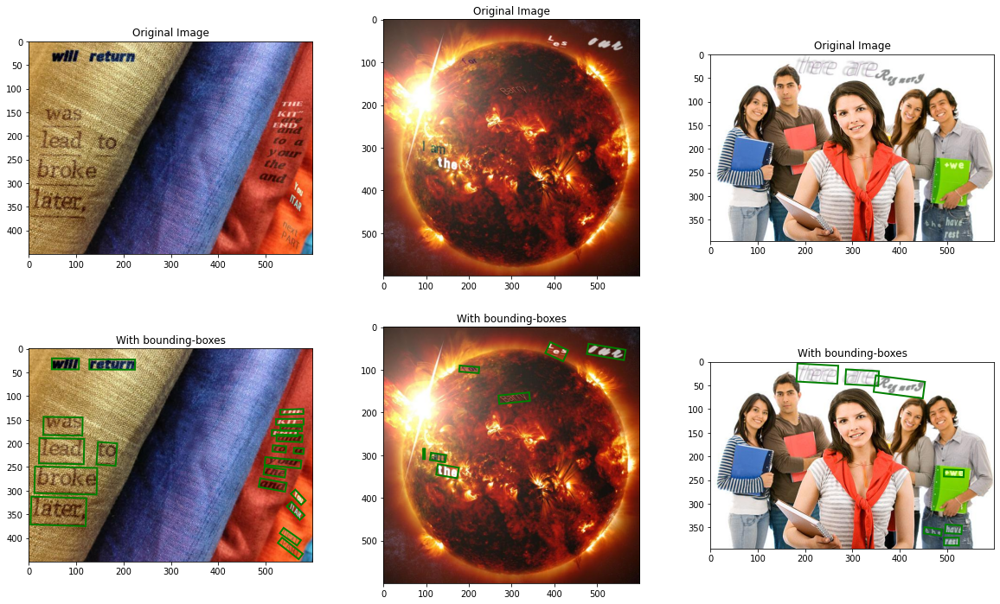

In [ ]:
#visualizing random 30 images with & with out bounding boxes
for i in range(10):
    samples=st_total.sample(3)
    img_zip_file="/content/SynthText.zip"
    images=samples['Image'].values
    bboxes=samples['BBox'].values
    extract_images_from_zip_file(img_zip_file,images)
    display_images_with_bounding_box(images,bboxes)
    remove_files(images)

### ICDAR-15

In [ ]:
#loading the saved icdar-15 pre-processed data-frame
icdar15_total=joblib.load('/content/gdrive/MyDrive/Colab Notebooks/Case_Study_2/icdar15_total.pkl.gz')

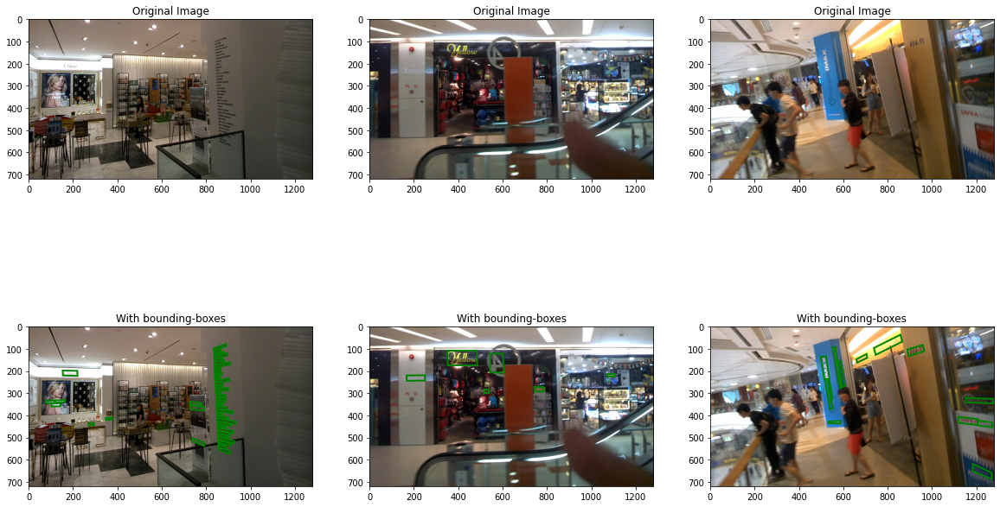

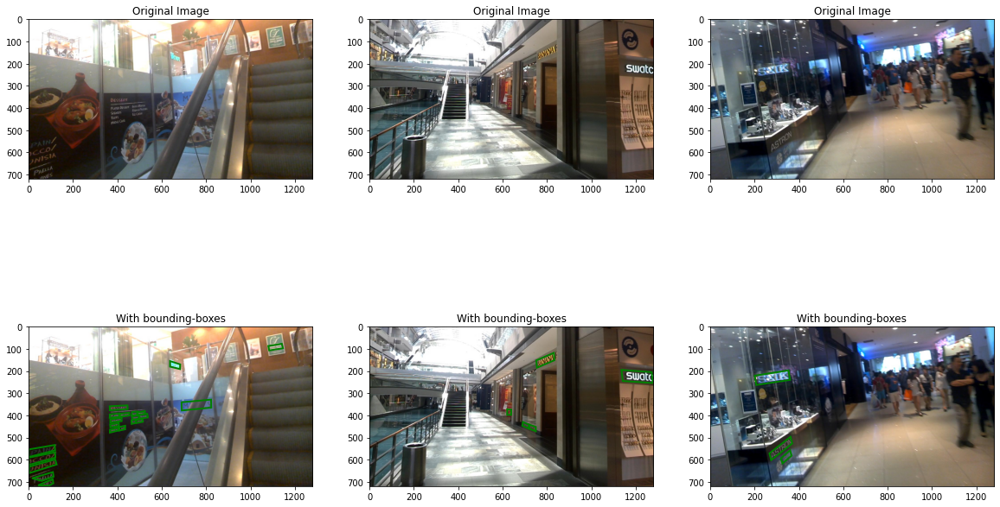

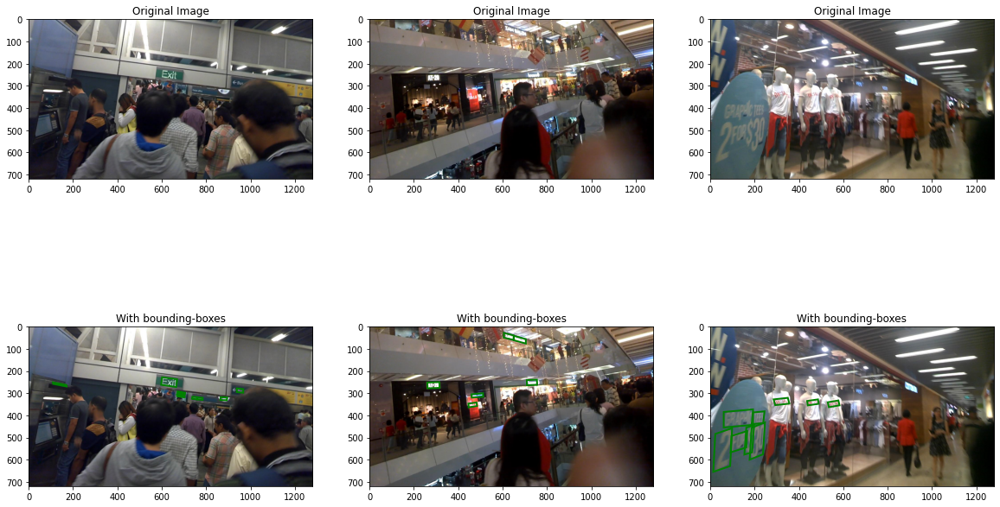

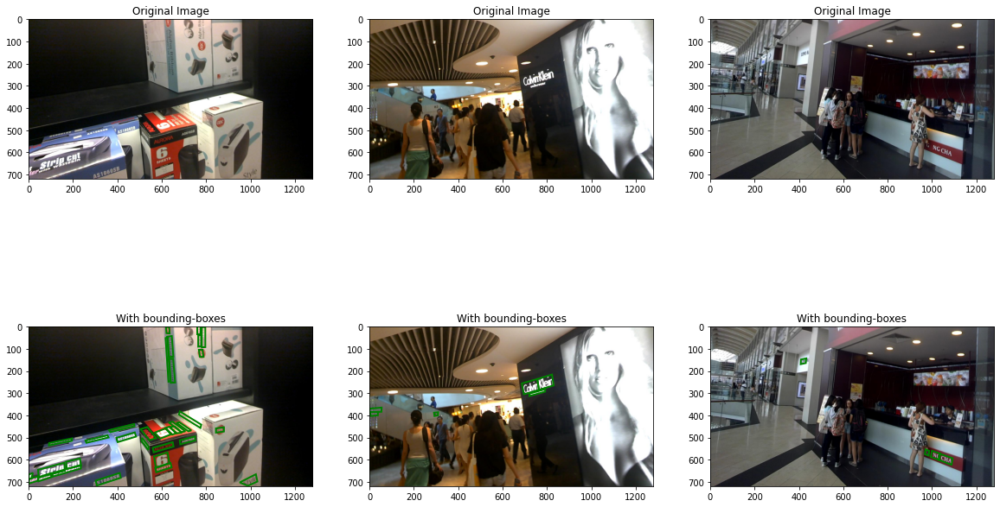

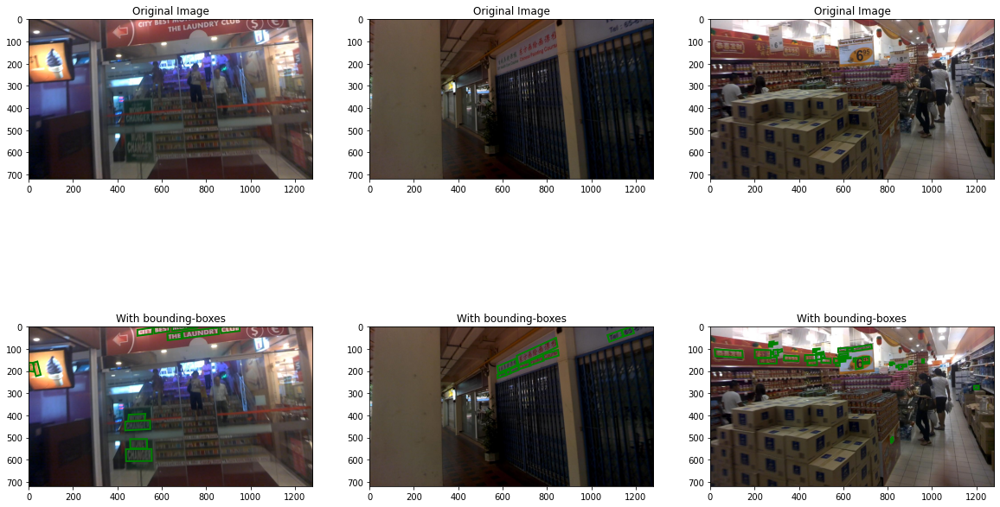

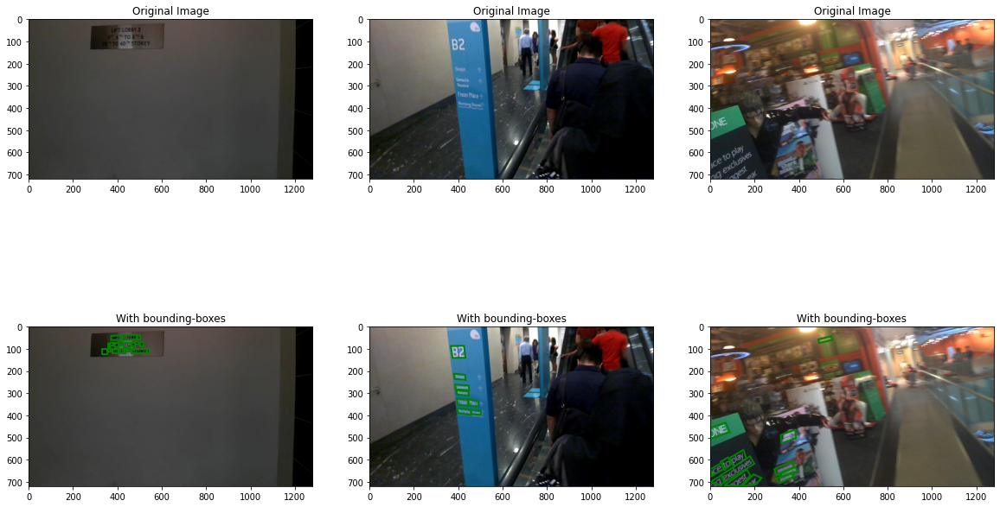

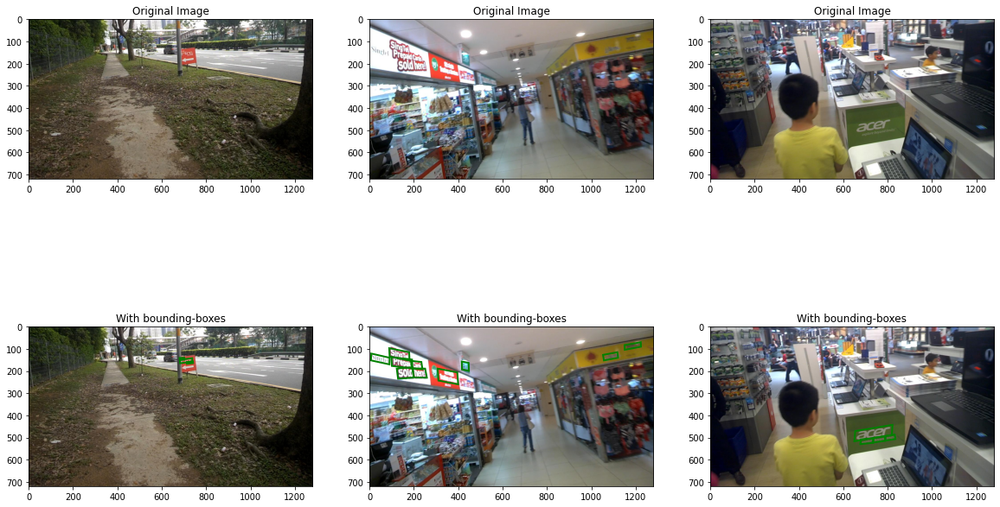

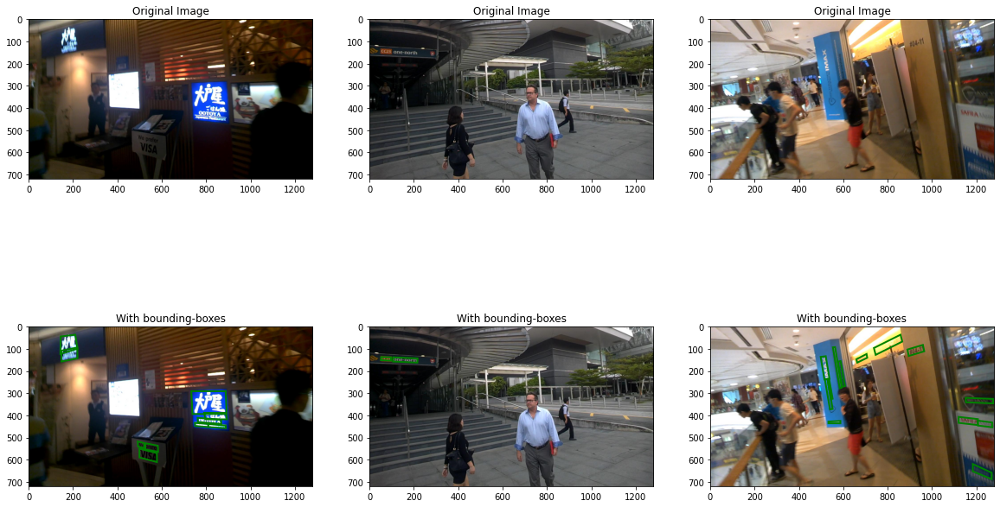

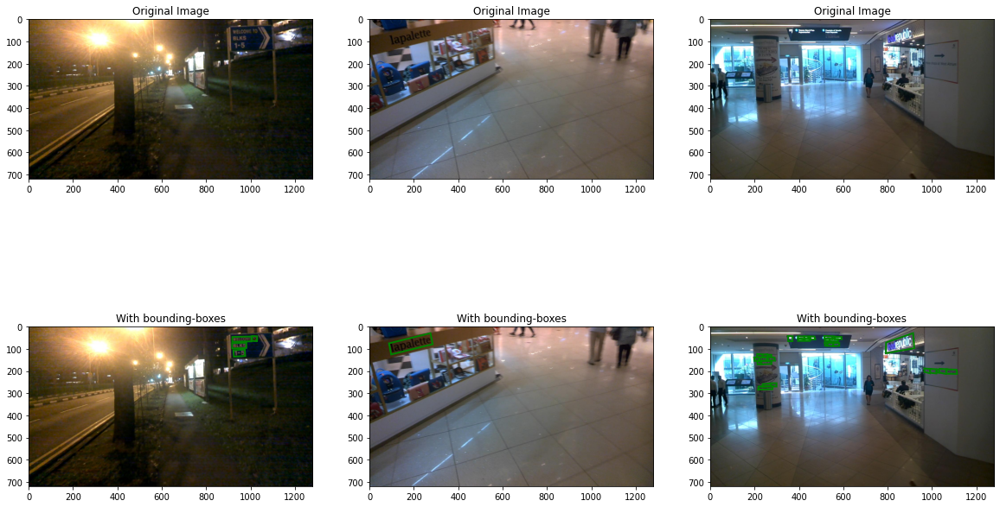

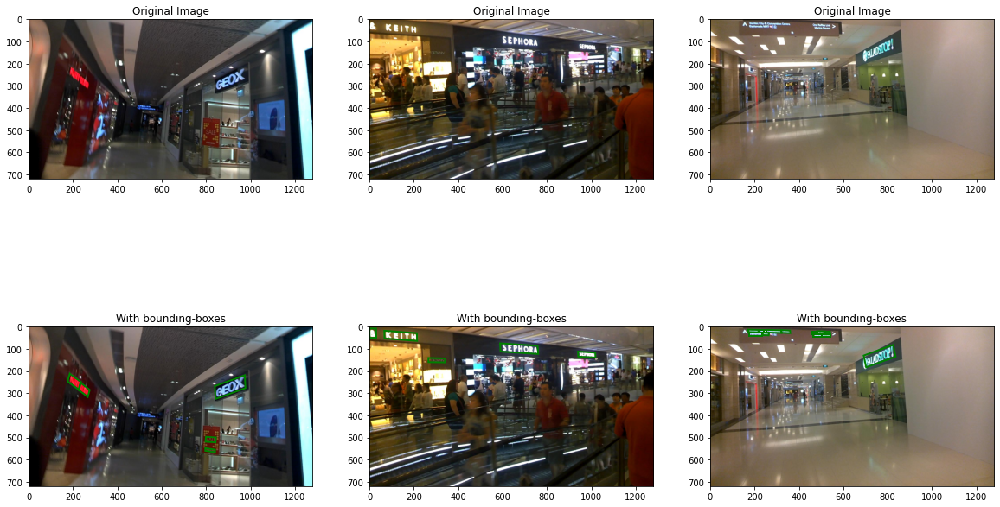

In [ ]:
#visualizing random 30 images with & with out bounding boxes
for i in range(10):
    samples=icdar15_total.sample(3)
    img_zip_file="/content/ch4_training_images.zip"
    images=samples['Image'].values
    bboxes=samples['BBox'].values
    extract_images_from_zip_file(img_zip_file,images)
    display_images_with_bounding_box(images,bboxes)
    remove_files(images)